### read me: （for data cleaning)
1. Some data were cleaned due to incomplete or ambiguous entries.
2. However, we still have 170 samples, which is more than the minimum requirement.
3. We found that the units for screen time, study hours, and sleep were inconsistent. Therefore, we converted all of them to a standard unit of hours.
4. social_media and screen_time are time spent on them for non-academic purpose in hours after converting  

### read me: 
1. The test is going to investigate how the study hours, screen time, and social hours affect stduents sleep hours.
2. We need to control the demographical and socio-economic factors, to do this we worked through two way: 
 set these variables as dummay variables into the regression model
2.2 control these variables, and put them into the different groups and test the coefficient.

In [1]:
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(dplyr)
library(ggplot2)
library(GGally)
library(car)
library(lmtest)
library(sandwich)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘

In [2]:
data <- read.csv("data2.csv", header = TRUE)

In [3]:
# Convert relevant variables to numeric
data <- data |> mutate(across(
  c(
    GPA,
    Hour_all_courses,
    Extra_hour_forexam,
    Coursetake.semester,
    AL_tool_Hour,
    hour_sports,
    hour_studentclub,
    hour_volunteer,
    hour_friends,
    hour_Socialize_family,
    IsDomestic,
    percent_financial_aid,
    Hour_work,
    sleep_hours,
    hour_social_media,
    Hour_screen_nonacademic,
    feeling_depress,
    Hour_commute,
  ),
  ~ as.numeric(.)
))




Warning message:
“There were 7 warnings in `mutate()`.
The first warning was:
ℹ In argument: `across(...)`.
Caused by warning:
! NAs introduced by coercion
ℹ Run `dplyr::last_dplyr_warnings()` to see the 6 remaining warnings.”


In [4]:
colnames(data) #The variables that are included

[1] "GPA"                                                                                         
 [2] "Hour_Econ326"                                                                                
 [3] "Hour_all_courses"                                                                            
 [4] "Extra_hour_forexam"                                                                          
 [5] "Coursetake.semester"                                                                         
 [6] "X7..Do.you.prefer.courses.that.focus.more.on.practical.applications.or.theoretical.concepts."
 [7] "AL_tool_Hour"                                                                                
 [8] "feel_of_AI_Tool"                                                                             
 [9] "Hour_classmaterial"                                                                          
[10] "Hour_Assignment"                                                                             
[11] "hour_sports"                                                                                 
[12] "hour_studentclub"                                                                            
[13] "hour_volunteer"                                                                              
[14] "hour_friends"                                                                                
[15] "hour_Socialize_family"                                                                       
[16] "student_type"                                                                                
[17] "IsDomestic"                                                                                  
[18] "Tuition_percourse"                                                                           
[19] "Scholarship"                                                                                 
[20] "percent_financial_aid"                                                                       
[21] "Work_or_not"                                                                                 
[22] "IsWorking"                                                                                   
[23] "work"                                                                                        
[24] "Hour_work"                                                                                   
[25] "feeling_financial_situation"                                                                 
[26] "sleep_hours"                                                                                 
[27] "minute_social_media"                                                                         
[28] "hour_social_media"                                                                           
[29] "Minute_screen_nonacademic"                                                                   
[30] "Hour_screen_nonacademic"                                                                     
[31] "feeling_depress"                                                                             
[32] "Minute_Commute"                                                                              
[33] "Hour_commute"                                                                                
[34] "Transportantion_mode"                                                                        
[35] "X30..Do.you.prefer.taking.online.courses..in.person.courses..or.a.hybrid.of.both."           
[36] "feeling_future_employ"                                                                       
[37] "Future_education"                                                                            
[38] "confidentlevel_job"                                                                          
[39] "career_path"                                                                                 
[40] "Faculty"                                                                                     
[

In [5]:
data <- data |>
    mutate(year_level = X37..Which.year.are.you.in.at.your.undergraduate.program.at.UBC.,
          hour_socialize = hour_Socialize_family + hour_friends) #combining these two into hour_socialize

In [6]:
head(data) 

,GPA,Hour_Econ326,Hour_all_courses,Extra_hour_forexam,Coursetake.semester,X7..Do.you.prefer.courses.that.focus.more.on.practical.applications.or.theoretical.concepts.,AL_tool_Hour,feel_of_AI_Tool,Hour_classmaterial,Hour_Assignment,⋯,X30..Do.you.prefer.taking.online.courses..in.person.courses..or.a.hybrid.of.both.,feeling_future_employ,Future_education,confidentlevel_job,career_path,Faculty,ethnicity,X37..Which.year.are.you.in.at.your.undergraduate.program.at.UBC.,year_level,hour_socialize
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<dbl>,<dbl>,⋯,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>
1,86.0,8,30,30,4.8,More practical applications,1,5,2.0,5.0,⋯,Hybrid (mix of both),3,Yes,3,"Finance, Banking, or Investment",Faculty of Arts,East Asian,3,3,10
2,78.6,1,5,4,5.0,More practical applications,2,5,1.0,2.0,⋯,Online courses,5,Unsure,1,"Finance, Banking, or Investment",Faculty of Commerce and Business Administration (Sauder School of Business),East Asian,3,3,20
3,63.0,9,21,8,4.0,More practical applications,12,5,6.0,5.0,⋯,Online courses,5,Yes,5,"Finance, Banking, or Investment",Faculty of Arts,East Asian,1,1,14
4,73.0,4,12,20,4.5,More practical applications,0,1,2.0,2.0,⋯,In-person courses,5,Unsure,5,Marketing or Communications,Faculty of Arts,East Asian,3,3,20
5,90.1,5,30,20,4.3,More practical applications,10,5,7.0,9.0,⋯,In-person courses,3,No,4,Entrepreneurship or Startups,Faculty of Arts,East Asian,3,3,15
6,73.0,4,20,7,5.0,More practical applications,2,4,1.5,3.5,⋯,Hybrid (mix of both),4,Yes,4,"Finance, Banking, or Investment",Other,White,1,1,13


In [7]:
data <- data |>
  slice_head(n = 168) |>#Since we have only 168 Observations, we can slice it at that point to remove NAs
    select(GPA, Hour_all_courses, Extra_hour_forexam, Coursetake.semester, AL_tool_Hour, hour_sports, hour_studentclub, hour_volunteer, hour_socialize, IsDomestic, percent_financial_aid, Hour_work, sleep_hours, hour_social_media, Hour_screen_nonacademic, feeling_depress, Hour_commute, year_level) |>
    mutate_all(~replace(., is.na(.), 0))

           

In [8]:
tail(data) #To check if we have sliced the data correctly and selected the right columns

,GPA,Hour_all_courses,Extra_hour_forexam,Coursetake.semester,AL_tool_Hour,hour_sports,hour_studentclub,hour_volunteer,hour_socialize,IsDomestic,percent_financial_aid,Hour_work,sleep_hours,hour_social_media,Hour_screen_nonacademic,feeling_depress,Hour_commute,year_level
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
163,90.0,20,10,3.0,10,4.0,6,5,15,0,0,0,6.0,3.33,1.92,2,12.5,2
164,75.0,21,8,4.0,12,4.0,5,3,14,0,0,12,6.0,3.33,2.00,4,12.5,2
165,70.0,8,5,4.0,5,3.0,10,0,8,0,0,0,6.0,2.00,3.00,4,15.0,3
166,72.0,20,8,4.0,6,8.0,4,2,13,0,0,0,6.0,4.00,4.00,4,7.5,3
167,79.3,14,6,3.5,1,5.5,0,0,4,0,0,4,8.5,0.75,3.67,1,12.5,3
168,84.0,10,5,4.5,2,6.0,1,0,12,0,0,0,7.0,3.33,5.50,3,5.0,3


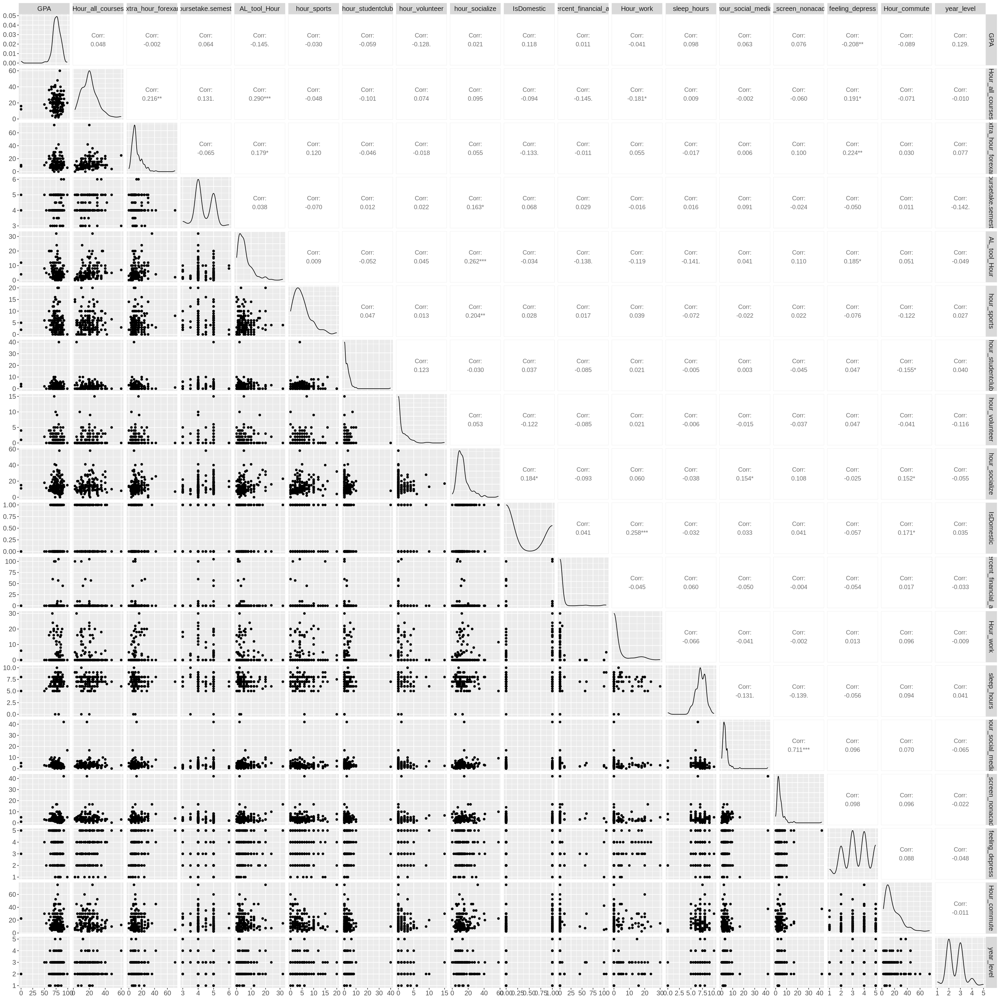

In [9]:
options(repr.plot.width = 25, repr.plot.height = 25)


class_data_pairplots <- 
    data %>%
    ggpairs(progress = FALSE) +
    theme(
        text = element_text(size = 15),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
    )

class_data_pairplots

In [10]:
#remove hour_social_media because it has a high correlation with Hour_screen_nonacademic and Hour_screen_nonacademic should include hour_scoail_media
data <- data |> select(GPA,
                       Hour_all_courses, 
                       Extra_hour_forexam, 
                       Coursetake.semester, 
                       AL_tool_Hour, 
                       hour_sports, 
                       hour_studentclub, 
                       hour_volunteer, 
                       hour_socialize, 
                       IsDomestic, 
                       percent_financial_aid, 
                       Hour_work, 
                       sleep_hours, 
                       Hour_screen_nonacademic,
                       feeling_depress, 
                       Hour_commute, 
                       year_level) 
head(data)

,GPA,Hour_all_courses,Extra_hour_forexam,Coursetake.semester,AL_tool_Hour,hour_sports,hour_studentclub,hour_volunteer,hour_socialize,IsDomestic,percent_financial_aid,Hour_work,sleep_hours,Hour_screen_nonacademic,feeling_depress,Hour_commute,year_level
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,86.0,30,30,4.8,1,4,2,0,10,0,0,0,6.5,2,4,12.5,3
2,78.6,5,4,5.0,2,4,3,1,20,0,0,16,7.0,3,4,10.0,3
3,63.0,21,8,4.0,12,4,5,3,14,1,0,0,6.0,2,5,12.5,1
4,73.0,12,20,4.5,0,16,10,5,20,0,0,0,7.0,1,5,10.0,3
5,90.1,30,20,4.3,10,0,0,0,15,0,0,0,7.0,3,3,10.0,3
6,73.0,20,7,5.0,2,6,0,1,13,0,0,0,0.0,3,2,5.0,1


## Regressions

In [11]:
#baseline model with main predictors only

sleep_hour_model <- lm(sleep_hours~ hour_sports + hour_socialize + Hour_all_courses + Hour_screen_nonacademic, data = data)

summary(sleep_hour_model)



Call:
lm(formula = sleep_hours ~ hour_sports + hour_socialize + Hour_all_courses + 
    Hour_screen_nonacademic, data = data)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.0647 -0.6609 -0.0456  0.8691  2.9477 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)              7.3475671  0.2999830  24.493   <2e-16 ***
hour_sports             -0.0215138  0.0254129  -0.847   0.3985    
hour_socialize          -0.0014684  0.0123914  -0.119   0.9058    
Hour_all_courses        -0.0002366  0.0103215  -0.023   0.9817    
Hour_screen_nonacademic -0.0433311  0.0246843  -1.755   0.0811 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.255 on 163 degrees of freedom
Multiple R-squared:  0.02425,	Adjusted R-squared:  0.0003058 
F-statistic: 1.013 on 4 and 163 DF,  p-value: 0.4025


In [12]:
#No statistical significance

In [13]:

#full model with controls

sleep_hour_model_full <- lm(sleep_hours~., data = data)

summary(sleep_hour_model_full)



Call:
lm(formula = sleep_hours ~ ., data = data)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.0173 -0.5797  0.0705  0.8371  2.6027 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              6.312232   1.183817   5.332 3.48e-07 ***
GPA                      0.010450   0.009387   1.113   0.2674    
Hour_all_courses         0.004079   0.011791   0.346   0.7299    
Extra_hour_forexam       0.002751   0.012521   0.220   0.8264    
Coursetake.semester      0.009237   0.173577   0.053   0.9576    
AL_tool_Hour            -0.032927   0.022053  -1.493   0.1375    
hour_sports             -0.016557   0.026623  -0.622   0.5349    
hour_studentclub         0.007115   0.027978   0.254   0.7996    
hour_volunteer           0.007091   0.050861   0.139   0.8893    
hour_socialize           0.001930   0.013635   0.142   0.8876    
IsDomestic              -0.118326   0.225656  -0.524   0.6008    
percent_financial_aid    0.003772   0.006676   0.

In [24]:
#Notes
#when we account for control vairables there are no statistical significance. 
#Prerna said to make tables with a table generator and you can manually type in stars and data

In [25]:
#quick check on model quality to check how well this model fits (don't have to include this one)

full_model_quality <- glance(sleep_hour_model_full)
full_model_quality


r.squared,adj.r.squared,sigma,statistic,p.value,df,logLik,AIC,BIC,deviance,df.residual,nobs
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
0.07416654,-0.02393502,1.269655,0.756018,0.7324035,16,-269.5294,575.0589,631.2902,243.4157,151,168


In [26]:
#Notes
#only explain 7.4% of the variation in sleep hours
#adjusted r squared is negative, which means too many variables that don't help much
# sleep is hard to predict, there are lots of unobserved factors (mood, habits, roommates etc)

## robustness check

In [27]:
#Heteroskedasticity robust standard errors
test1 <- coeftest(sleep_hour_model_full, vcov = vcovHC(sleep_hour_model_full, type = "HC1"))

print(test1)


t test of coefficients:

                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)              6.3122322  1.1078639  5.6977 6.17e-08 ***
GPA                      0.0104498  0.0088513  1.1806  0.23962    
Hour_all_courses         0.0040793  0.0093463  0.4365  0.66313    
Extra_hour_forexam       0.0027513  0.0077922  0.3531  0.72452    
Coursetake.semester      0.0092373  0.1645671  0.0561  0.95531    
AL_tool_Hour            -0.0329271  0.0192187 -1.7133  0.08871 .  
hour_sports             -0.0165572  0.0478736 -0.3459  0.72994    
hour_studentclub         0.0071149  0.0190961  0.3726  0.70998    
hour_volunteer           0.0070913  0.0432852  0.1638  0.87009    
hour_socialize           0.0019297  0.0172788  0.1117  0.91123    
IsDomestic              -0.1183264  0.2385460 -0.4960  0.62059    
percent_financial_aid    0.0037720  0.0091873  0.4106  0.68197    
Hour_work               -0.0149518  0.0133790 -1.1176  0.26553    
Hour_screen_nonacademic -0.0439669  

Using heteroskedasticity-robust standard errors, the variable Hour_screen_nonacademic was statistically significant (p = 0.04080). This suggests that, holding other factors constant, students who spend more time on non-academic screen activities tend to sleep less. Specifically, each additional hour of non-academic screen use is associated with an estimated 0.044-hour (approximately 2.6 minutes) decrease in sleep

In [28]:
#Robustness check 2
#Another way we can check for robustness is by removing outliers. 

data_trimmed <- data %>%
  filter(between(sleep_hours, 
                 quantile(sleep_hours, 0.05),
                 quantile(sleep_hours, 0.95)))



In [29]:
#base model with outliers trimmed 
sleep_hour_model_trimmed <- lm(sleep_hours~ hour_sports + hour_socialize + Hour_all_courses + Hour_screen_nonacademic, data = data_trimmed)

summary(sleep_hour_model_trimmed)


Call:
lm(formula = sleep_hours ~ hour_sports + hour_socialize + Hour_all_courses + 
    Hour_screen_nonacademic, data = data_trimmed)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.09059 -0.62979  0.02783  0.87426  1.50724 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              7.112947   0.218829  32.505   <2e-16 ***
hour_sports              0.029422   0.020111   1.463    0.146    
hour_socialize          -0.011822   0.009085  -1.301    0.195    
Hour_all_courses         0.001763   0.007631   0.231    0.818    
Hour_screen_nonacademic -0.028680   0.017658  -1.624    0.106    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8854 on 152 degrees of freedom
Multiple R-squared:  0.04058,	Adjusted R-squared:  0.01533 
F-statistic: 1.607 on 4 and 152 DF,  p-value: 0.1753


no significance which is consistent with the findings above

In [30]:
sleep_hour_model_full_trimmed <- lm(sleep_hours~., data = data_trimmed)

summary(sleep_hour_model_full_trimmed)


Call:
lm(formula = sleep_hours ~ ., data = data_trimmed)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.19040 -0.62882  0.06176  0.73524  1.52740 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              7.199233   0.827871   8.696 8.33e-15 ***
GPA                      0.008301   0.006479   1.281   0.2023    
Hour_all_courses         0.002944   0.008431   0.349   0.7275    
Extra_hour_forexam       0.003764   0.008722   0.432   0.6667    
Coursetake.semester     -0.017050   0.123055  -0.139   0.8900    
AL_tool_Hour            -0.032153   0.015402  -2.088   0.0386 *  
hour_sports              0.029826   0.020434   1.460   0.1466    
hour_studentclub        -0.012412   0.019430  -0.639   0.5240    
hour_volunteer          -0.011886   0.035708  -0.333   0.7397    
hour_socialize          -0.009136   0.009666  -0.945   0.3462    
IsDomestic               0.014498   0.162888   0.089   0.9292    
percent_financial_aid   -0.0138

After trimming the top and bottom 5% of observations in sleep_hours to remove extreme values, we re-estimated the full model. The adjusted R-squared increased from to 0.041. While two control variables AL_tool_Hour and percent_financial_aid became statistically significant, our main variable of interest remained insignificant. This suggests that the core finding is robust to the exclusion of outliers.

In [31]:
# The last robustness check that will be ran is anova

anova_result <- anova(sleep_hour_model, sleep_hour_model_full)
print(anova_result)

Analysis of Variance Table

Model 1: sleep_hours ~ hour_sports + hour_socialize + Hour_all_courses + 
    Hour_screen_nonacademic
Model 2: sleep_hours ~ GPA + Hour_all_courses + Extra_hour_forexam + Coursetake.semester + 
    AL_tool_Hour + hour_sports + hour_studentclub + hour_volunteer + 
    hour_socialize + IsDomestic + percent_financial_aid + Hour_work + 
    Hour_screen_nonacademic + feeling_depress + Hour_commute + 
    year_level
  Res.Df    RSS Df Sum of Sq      F Pr(>F)
1    163 256.54                           
2    151 243.42 12    13.124 0.6784 0.7702


Using ANOVA to compare the base and full models, we found found no statistically significant improvement in model fit from including control variables (p = 0.7702). This suggests that, in the presence of all data points, the control variables do not contribute significantly to explaining variation in sleep hours.

However, from the previous robustness check that used a trimmed dataset where we excluded the outliers, the full model showed that several control variables AI_tool_Hour and percent_financial_aid became statistically significant. This indicates that the relevance of control variables is sensitive to extreme values in the sleep_hours response, and that their effects are more detectable when the outliers are removed. 

# Specification Check

lm assumes that either the errors are Normal or the conditions of the CLT are met. Regardless, lm assumes that the sampling distribution can be approximated by a 
t-Student distribution. A Q-Q plot and histogram can help us assess these assumptions

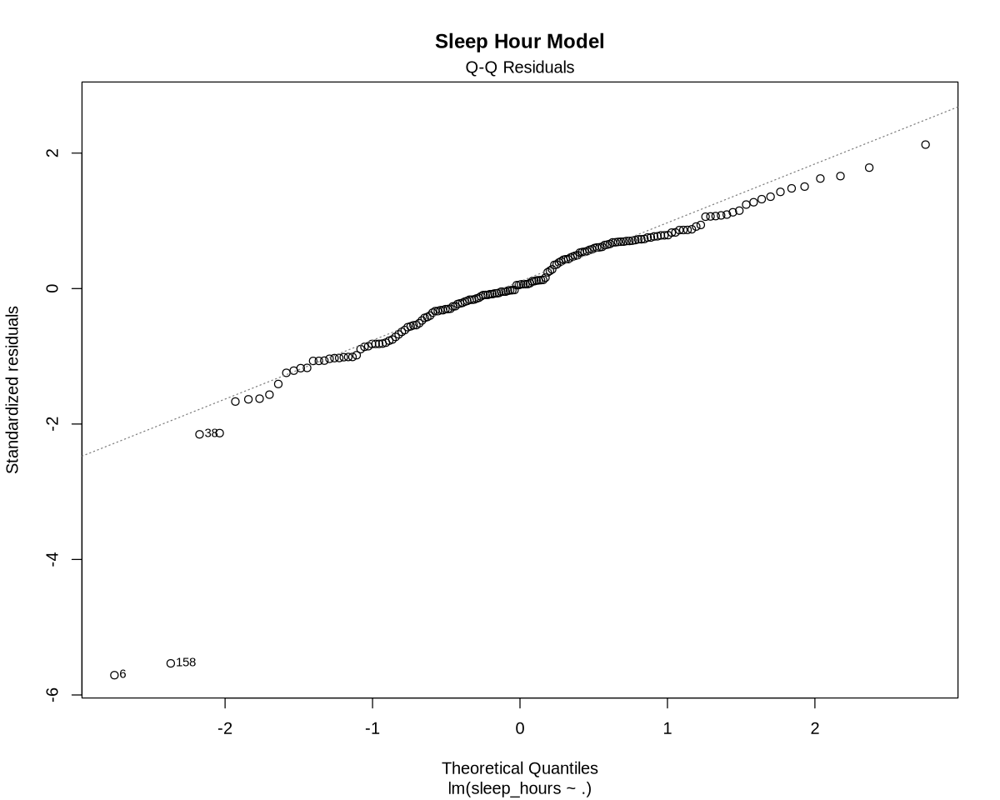

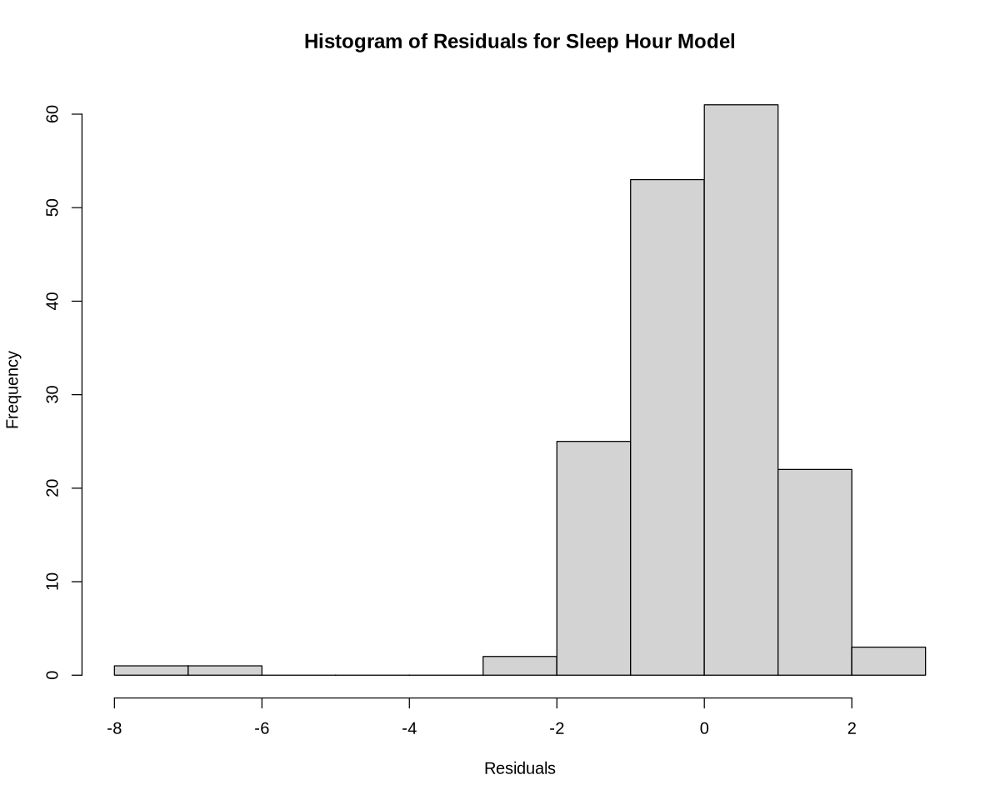

In [33]:
options(repr.plot.width = 10, repr.plot.height = 8)


plot(sleep_hour_model_full, 2, main = "Sleep Hour Model")

hist(residuals(sleep_hour_model_full), breaks = 10, main = "Histogram of Residuals for Sleep Hour Model", xlab = "Residuals")

* IMPORTANT: The Q-Q plot on the origianl full model shows some tail deviation, and the histogram of residuals are concentrated around zero, but there are a small number of extreme negative residuals. Therefore, we should use the one with the robust S.E from the coeftest() result, as this suggest that it may affect inference based on classical OLS assumptions.



In [34]:
vif_table <- vif(sleep_hour_model_full)

print(vif_table)

                    GPA        Hour_all_courses      Extra_hour_forexam 
               1.162380                1.298556                1.198431 
    Coursetake.semester            AL_tool_Hour             hour_sports 
               1.095936                1.273558                1.123355 
       hour_studentclub          hour_volunteer          hour_socialize 
               1.090815                1.078349                1.263883 
             IsDomestic   percent_financial_aid               Hour_work 
               1.218397                1.070380                1.158504 
Hour_screen_nonacademic         feeling_depress            Hour_commute 
               1.072362                1.191670                1.149212 
             year_level 
               1.070005 


### A VIF value of 1-2 indicates very low multicolinearity